# Step 3: Design Ticker Subsets and Sampling Strategy

Identify a subset of tickers that best mirrors full-market volatility behavior using stratified sampling based on volatility, volume, and market cap proxy.

## Steps:
1. Load features from data/processed/nasdaq_features.csv and market_volatility.csv
2. Compute per-ticker metrics (daily/annualized volatility, avg volume, market cap proxy)
3. Create S&P 500 temporal union from historical data (2000, 2010, 2019) to avoid survivorship bias
4. Generate 200 randomized stratified subsets balanced across volatility, volume, and market cap deciles
5. Evaluate all subsets (201 total: 1 benchmark + 200 stratified) using Pearson correlation, Spearman correlation, and Mean Absolute Deviation
6. Select best-performing subset based on combined score and visualize alignment with full market
7. Create mood indicators and features for the best subset to use in subsequent analysis steps

In [2]:
# Import required libraries
import sys
from pathlib import Path
import pandas as pd
from pandas.errors import EmptyDataError
import numpy as np
import json
import joblib
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

# Add project root to path
sys.path.append(str(Path('..').resolve()))

# Import our custom functions
from src.data.sampling.sampling import (
    compute_ticker_features,
    create_known_subsets,
    generate_stratified_subset,
    generate_combined_stratified_subset,
    evaluate_subset,
    select_best_subset
)

# Compute volatility for each of the top 5 subsets
from src.data.indicators.volatility import compute_market_volatility_index_unified

plt.rcParams['figure.dpi'] = 300 #ensure image are displayed with good quality
plt.rcParams['savefig.dpi'] = 300  

In [3]:
# Create required output directories
from pathlib import Path

output_dirs = [
    Path('../data/processed/subsets'),
    Path('../results/tables'),
    Path('../results/figures'),
]

for dir_path in output_dirs:
    dir_path.mkdir(parents=True, exist_ok=True)

## 1&2 Load Data and Compute Ticker Features


In [4]:
# Load features and market volatility
features_df = pd.read_csv('../data/processed/nasdaq_features.csv')
features_df['Date'] = pd.to_datetime(features_df['date'])

# Load market volatility
# When saved with index=True, Date is the first column and should be used as index
market_volatility_df = pd.read_csv('../data/processed/market_volatility.csv')
if 'Date' in market_volatility_df.columns:
    # New format: Date column exists, use it as index
    market_volatility_df['Date'] = pd.to_datetime(market_volatility_df['Date'])
    market_volatility_df.set_index('Date', inplace=True)
else:
    # Old format: Date column missing, reconstruct from features_df
    unique_dates = pd.Series(features_df['Date'].unique()).sort_values().reset_index(drop=True)
    market_volatility_df['Date'] = unique_dates.iloc[:len(market_volatility_df)].values
    market_volatility_df['Date'] = pd.to_datetime(market_volatility_df['Date'])
    market_volatility_df.set_index('Date', inplace=True)

# Compute per-ticker metrics
ticker_metrics = compute_ticker_features(features_df)

# Save ticker metrics
ticker_metrics.to_csv('../data/processed/subsets/ticker_metrics.csv', index=False)

Computing ticker features: 100%|██████████████████████████████████████████████████| 4164/4164 [00:05<00:00, 766.69it/s]


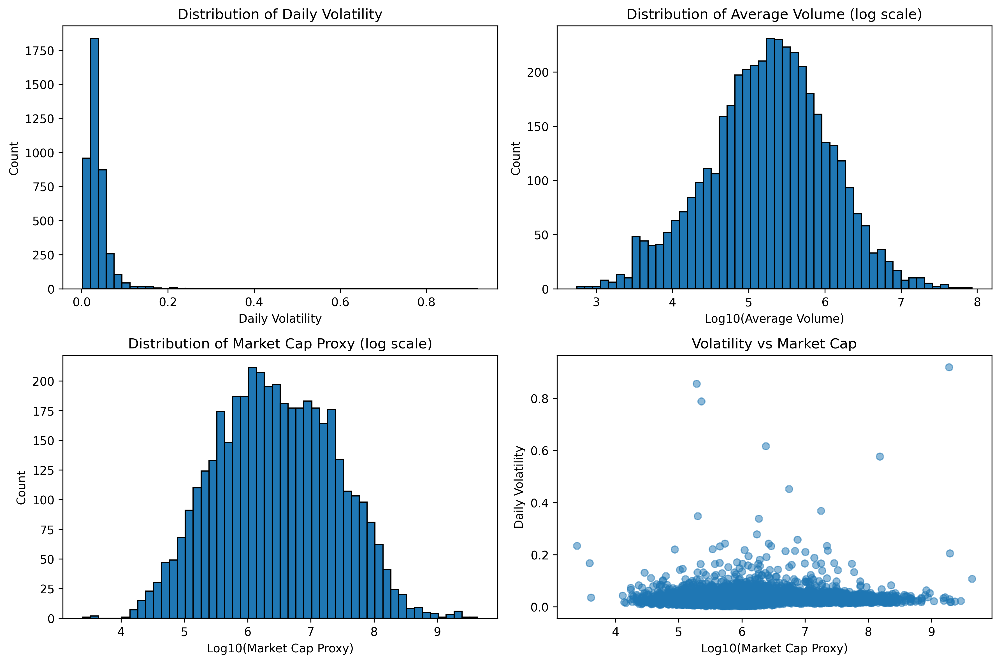

In [5]:
# Visualize distributions of metrics
fig, axes = plt.subplots(2, 2, figsize=(12, 8), dpi=300)

# Daily volatility distribution
axes[0, 0].hist(ticker_metrics['daily_volatility'], bins=50, edgecolor='black')
axes[0, 0].set_xlabel('Daily Volatility')
axes[0, 0].set_ylabel('Count')
axes[0, 0].set_title('Distribution of Daily Volatility')

# Log volume distribution
axes[0, 1].hist(np.log10(ticker_metrics['avg_volume']), bins=50, edgecolor='black')
axes[0, 1].set_xlabel('Log10(Average Volume)')
axes[0, 1].set_ylabel('Count')
axes[0, 1].set_title('Distribution of Average Volume (log scale)')

# Log market cap proxy distribution
axes[1, 0].hist(np.log10(ticker_metrics['avg_market_cap_proxy']), bins=50, edgecolor='black')
axes[1, 0].set_xlabel('Log10(Market Cap Proxy)')
axes[1, 0].set_ylabel('Count')
axes[1, 0].set_title('Distribution of Market Cap Proxy (log scale)')

# Scatter: volatility vs market cap
axes[1, 1].scatter(np.log10(ticker_metrics['avg_market_cap_proxy']), 
                   ticker_metrics['daily_volatility'], 
                   alpha=0.5)
axes[1, 1].set_xlabel('Log10(Market Cap Proxy)')
axes[1, 1].set_ylabel('Daily Volatility')
axes[1, 1].set_title('Volatility vs Market Cap')

plt.tight_layout()
plt.show()


## 3. Create S&P 500 Temporal Union

**Why temporal union instead of current members?**
- Dataset covers 2000-2020 (filtered from original 1962-2020)
- Using only current (2024) S&P 500 members introduces **survivorship bias**:
  - Missing dot-com era companies that failed during 2000-2002
  - Missing companies acquired during 2008 financial crisis
  - Missing companies delisted or replaced over 20 years

**Solution: Temporal Union**
- Take union of S&P 500 members from three snapshots:
  - December 31, 2000 (dot-com era)
  - December 31, 2010 (post-financial crisis)
  - December 31, 2019 (pre-COVID market)
- Filter to NASDAQ-listed only (our dataset)
- Data source: fja05680/sp500 GitHub repository (curated historical data for the S&P 500)


In [6]:
# Create S&P 500 temporal union from historical data
# This uses the fja05680/sp500 dataset to get actual S&P 500 membership
# from 2000, 2010, and 2019, then creates a union of all three periods
from src.data.sampling.historical_indices import create_sp500_temporal_union

temporal_union = create_sp500_temporal_union(
    ticker_metrics, 
    csv_path='../data/helper/S&P 500 Historical Components & Changes(11-16-2025).csv'
)
known_subsets = temporal_union

# Save temporal union subset
for name, tickers in known_subsets.items():
    if len(tickers) > 0:
        subset_df = pd.DataFrame({'ticker': tickers})
        subset_df.to_csv(f'../data/processed/subsets/{name}.csv', index=False)


### S&P 500 Temporal Union Results

**Data Source:** fja05680/sp500 GitHub repository  
**File:** `S&P 500 Historical Components & Changes(11-16-2025).csv`

| Period | S&P 500 Constituents | Union Coverage | NASDAQ Available |
|--------|---------------------|----------------|------------------|
| 2000-12-31 | 492 tickers | | |
| 2010-12-31 | 497 tickers | | |
| 2019-12-31 | 505 tickers | | |
| **Total Union** | **863 unique tickers** | Across 3 periods | **341 tickers** |

**Note:** Many S&P 500 companies are NYSE-listed. Only NASDAQ-listed companies appear in this filtered list.

This temporal union will be evaluated against stratified random subsets. The best-performing subset will be used for subsequent analysis.


## 4. Generate Stratified Random Subsets

In [7]:
# Generate stratified subsets based on combined criteria
# This creates 200 randomized subsets balanced across volatility, volume, and market cap
stratified_subsets = {}

criteria = ['daily_volatility', 'avg_volume', 'avg_market_cap_proxy']

for i in tqdm(range(200), desc="Generating stratified subsets"):
    combined_subset = generate_combined_stratified_subset(
        ticker_metrics, 
        criteria, 
        n_per_criterion=100,  # 100 tickers per criterion = ~300 total
        random_seed=42 + i
    )
    stratified_subsets[f'stratified_combined_{i+1}'] = combined_subset

# Save stratified subsets
for name, tickers in stratified_subsets.items():
    with open(f'../data/processed/subsets/randomized_{name}.json', 'w') as f:
        json.dump(tickers, f)


Generating stratified subsets: 100%|█████████████████████████████████████████████████| 200/200 [00:06<00:00, 29.06it/s]


## 5. Evaluate All Subsets

**Evaluation Method**:

For each subset (201 total: 1 S&P 500 temporal union + 200 stratified random):

1. **Compute subset volatility**: Calculate cross-sectional volatility from subset tickers
2. **Compare to full-market volatility**: Measure alignment using three metrics (Pearson Correlation, Spearman Correlation, Mean Absolute Deviation)
3. **Rank subsets**: Select best performer based on combined score

In [8]:
# Combine all subsets for evaluation
all_subsets = {}

# Add known subsets
for name, tickers in known_subsets.items():
    if len(tickers) > 0:
        all_subsets[name] = tickers

# Add stratified subsets
for name, tickers in stratified_subsets.items():
    all_subsets[name] = tickers

print(f"Total subsets to evaluate: {len(all_subsets)}")
print(f"  - 1 benchmark (S&P 500 temporal union)")
print(f"  - {len(stratified_subsets)} stratified random subsets")


Total subsets to evaluate: 201
  - 1 benchmark (S&P 500 temporal union)
  - 200 stratified random subsets


In [9]:
# Evaluate all subsets
evaluation_results = {}

for name, tickers in tqdm(all_subsets.items(), desc="Evaluating subsets"):
    try:
        metrics = evaluate_subset(tickers, features_df, market_volatility_df)
        evaluation_results[name] = metrics
    # Catch specific data issues (most common in finance pipelines)
    except (KeyError, ValueError, TypeError, EmptyDataError) as e:
        print(f"Skipping {name} due to data error: {e}")
        continue

# Convert to DataFrame for easy viewing
results_df = pd.DataFrame(evaluation_results).T
results_df = results_df.round(4)

# Save evaluation metrics
results_df.to_csv('../results/tables/evaluation_metrics.csv')


Evaluating subsets: 100%|████████████████████████████████████████████████████████████| 201/201 [05:58<00:00,  1.78s/it]

Saved evaluation metrics to: results/tables/evaluation_metrics.csv


### Evaluation Results


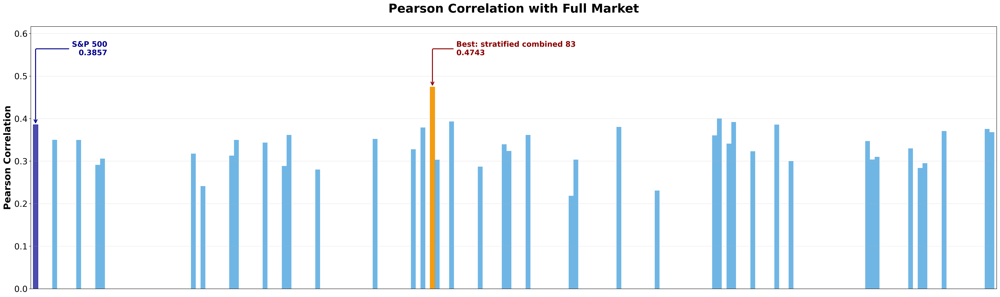

In [22]:
plt.figure(figsize=(30, 9), dpi=300) # Slightly taller to accommodate big text

bars = plt.bar(range(len(results_df)), results_df['pearson_correlation'], width=1.0, color='#3498db', alpha=0.7)

best_idx = results_df['pearson_correlation'].idxmax()
best_pos = results_df.index.get_loc(best_idx)
best_val = results_df.loc[best_idx, 'pearson_correlation']

# Highlight best
bars[best_pos].set_color('#f39c12')
bars[best_pos].set_alpha(1.0)

best_label = str(best_idx).replace('_', ' ')

# Calculate a fixed height for labels so they are level
max_val = results_df['pearson_correlation'].max()
label_y_pos = max_val * 1.15 

# Annotation for BEST (with the underscore replaced)
plt.annotate(f'Best: {best_label}\n{best_val:.4f}', 
             xy=(best_pos, best_val), 
             xytext=(best_pos + 5, label_y_pos), 
             ha='left', va='bottom', fontsize=16, fontweight='bold', color='darkred',
             arrowprops=dict(
                 arrowstyle='->', 
                 color='darkred', 
                 lw=2,
                 connectionstyle="angle,angleA=0,angleB=90,rad=10"
             ),
             bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="none", alpha=0.8))

# 3. Annotation for S&P 500
if 'temporal_union_sp500' in results_df.index:
    sp500_pos = results_df.index.get_loc('temporal_union_sp500')
    sp500_val = results_df.loc['temporal_union_sp500', 'pearson_correlation']
    bars[sp500_pos].set_color('darkblue')
    
    plt.annotate(f'S&P 500\n{sp500_val:.4f}', 
                 xy=(sp500_pos, sp500_val), 
                 xytext=(sp500_pos + 15, label_y_pos), # Offset horizontally the other way
                 ha='right', va='bottom', fontsize=16, fontweight='bold', color='darkblue',
                 arrowprops=dict(
                     arrowstyle='->', 
                     color='darkblue', 
                     lw=2,
                     connectionstyle="angle,angleA=0,angleB=90,rad=10"
                 ),
                 bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="none", alpha=0.8))

# 4. Increase Y-limit to make room for the labels
plt.ylim(0, max_val * 1.3)

# Big Labels
plt.ylabel('Pearson Correlation', fontsize=20, fontweight='bold')
plt.title('Pearson Correlation with Full Market', fontsize=26, fontweight='bold', pad=30)

# Big Ticks (Crucial for readability)
plt.tick_params(axis='y', labelsize=18)
plt.xticks([]) # Hide x ticks as requested

plt.grid(axis='y', alpha=0.3)
plt.xlim(-1, len(results_df))
plt.tight_layout()
plt.savefig('../results/figures/subset_pearson_correlation.png', dpi=300, bbox_inches='tight')
plt.show()

Here, for the **Pearson correlation**, higher is better because the Pearson correlation measures the **linear relationship** between subset volatility and full market volatility. A higher value indicates that the subset's volatility moves proportionally with the overall market, making it a better proxy for market-wide stress. Values range from -1 to 1, with 1 being perfect positive correlation.

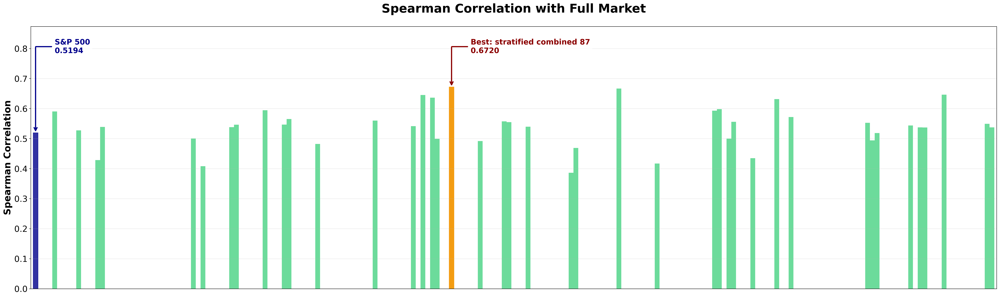

In [23]:
plt.figure(figsize=(30, 9), dpi=300)
bars = plt.bar(range(len(results_df)), results_df['spearman_correlation'], width=1.0, color='#2ecc71', alpha=0.7)

best_idx = results_df['spearman_correlation'].idxmax()
best_pos = results_df.index.get_loc(best_idx)
best_val = results_df.loc[best_idx, 'spearman_correlation']
bars[best_pos].set_color('#f39c12')
bars[best_pos].set_alpha(1.0)

# 1. Setup labels and find max for vertical alignment
best_label = str(best_idx).replace('_', ' ')
max_val = results_df['spearman_correlation'].max()

label_y_fixed = max_val * 1.20 

plt.annotate(f'Best: {best_label}\n{best_val:.4f}', 
             xy=(best_pos, best_val), 
             xytext=(best_pos + 4, label_y_fixed), 
             ha='left', va='center', fontsize=16, fontweight='bold', color='darkred',
             arrowprops=dict(
                 arrowstyle='->', 
                 color='darkred', 
                 lw=2.5,
                 connectionstyle="angle,angleA=0,angleB=90,rad=5" 
             ),
             bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="none", alpha=0.8))

if 'temporal_union_sp500' in results_df.index:
    sp500_pos = results_df.index.get_loc('temporal_union_sp500')
    sp500_val = results_df.loc['temporal_union_sp500', 'spearman_correlation']
    
    bars[sp500_pos].set_color('darkblue')
    bars[sp500_pos].set_alpha(0.8)
    
    plt.annotate(f'S&P 500\n{sp500_val:.4f}', 
                 xy=(sp500_pos, sp500_val), 
                 xytext=(sp500_pos + 4, label_y_fixed),
                 ha='left', va='center', fontsize=16, fontweight='bold', color='darkblue',
                 arrowprops=dict(
                     arrowstyle='->', 
                     color='darkblue', 
                     lw=2.5,
                     connectionstyle="angle,angleA=0,angleB=90,rad=5"
                 ),
                 bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="none", alpha=0.8))

plt.title('Spearman Correlation with Full Market', fontsize=26, fontweight='bold', pad=30)
plt.ylabel('Spearman Correlation', fontsize=20, fontweight='bold')
plt.ylim(0, max_val * 1.3) 

plt.ylabel('Spearman Correlation', fontsize=20, fontweight='bold')
plt.title('Spearman Correlation with Full Market', fontsize=26, fontweight='bold', pad=30)
plt.tick_params(axis='y', labelsize=18)
plt.xticks([])

plt.grid(axis='y', alpha=0.3)
plt.xlim(-1, len(results_df))
plt.tight_layout()
plt.savefig('../results/figures/subset_spearman_correlation.png', dpi=300, bbox_inches='tight')
plt.show()

Here, for the **Spearman correlation**, higher is better because the Spearman correlation measures the **rank-order relationship** between subset and market volatility. Unlike Pearson, it captures monotonic relationships regardless of linearity. A higher value means the subset correctly identifies when the market is more or less volatile relative to other periods, even if the magnitude differs.

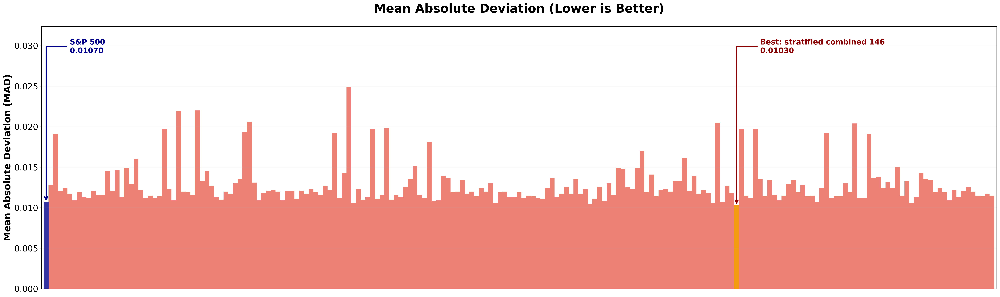

In [25]:
plt.figure(figsize=(30, 9), dpi=300)
bars = plt.bar(range(len(results_df)), results_df['mean_absolute_deviation'], width=1.0, color='#e74c3c', alpha=0.7)

best_idx = results_df['mean_absolute_deviation'].idxmin()
best_pos = results_df.index.get_loc(best_idx)
best_val = results_df.loc[best_idx, 'mean_absolute_deviation']
bars[best_pos].set_color('#f39c12')
bars[best_pos].set_alpha(1.0)

# 1. Prepare clean label and find max height for alignment
best_label = str(best_idx).replace('_', ' ')
# We use the max value to determine a single "ceiling" for both labels
max_val_plot = results_df['mean_absolute_deviation'].max()
fixed_height = max_val_plot * 1.2  # Places text 20% above the highest bar

# 2. Annotation for BEST (Shifted to the right with elbow arrow)
plt.annotate(f'Best: {best_label}\n{best_val:.5f}', 
             xy=(best_pos, best_val), 
             xytext=(best_pos + 5, fixed_height), # +5 shifts text to the right
             ha='left', va='center', fontsize=16, fontweight='bold', color='darkred',
             arrowprops=dict(
                 arrowstyle='->', 
                 color='darkred', 
                 lw=2.5,
                 connectionstyle="angle,angleA=0,angleB=90,rad=5" # Clean elbow bend
             ),
             bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="none", alpha=0.8))

# 3. Annotation for S&P 500 (Same logic: same height, shifted right)
if 'temporal_union_sp500' in results_df.index:
    sp500_pos = results_df.index.get_loc('temporal_union_sp500')
    sp500_val = results_df.loc['temporal_union_sp500', 'mean_absolute_deviation']
    
    # Highlight the S&P 500 bar (using Red to make it stand out from the blue bars)
    bars[sp500_pos].set_color('darkblue') 
    bars[sp500_pos].set_alpha(0.8)
    
    plt.annotate(f'S&P 500\n{sp500_val:.5f}', 
                 xy=(sp500_pos, sp500_val), 
                 xytext=(sp500_pos + 5, fixed_height), # Same height as the "Best" label
                 ha='left', va='center', fontsize=16, fontweight='bold', color='darkblue',
                 arrowprops=dict(
                     arrowstyle='->', 
                     color='darkblue', 
                     lw=2.5,
                     connectionstyle="angle,angleA=0,angleB=90,rad=5"
                 ),
                 bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="none", alpha=0.8))

# 4. Give the chart extra "headroom" so the labels don't hit the top
plt.ylim(0, max_val_plot * 1.3) 

plt.ylabel('Mean Absolute Deviation (MAD)', fontsize=20, fontweight='bold')
plt.title('Mean Absolute Deviation (Lower is Better)', fontsize=26, fontweight='bold', pad=30)
plt.tick_params(axis='y', labelsize=18)
plt.xticks([])

plt.grid(axis='y', alpha=0.3)
plt.xlim(-1, len(results_df))
plt.tight_layout()
plt.savefig('../results/figures/subset_mad.png', dpi=300, bbox_inches='tight')
plt.show()

Here for the **Mean Absolute Deviation**, lower is better because MAD measures the **average absolute difference** between subset volatility and full market volatility. A lower value indicates higher precision, meaning the subset's volatility closely matches the actual market volatility in magnitude. This complements correlation by measuring accuracy rather than just directional alignment.

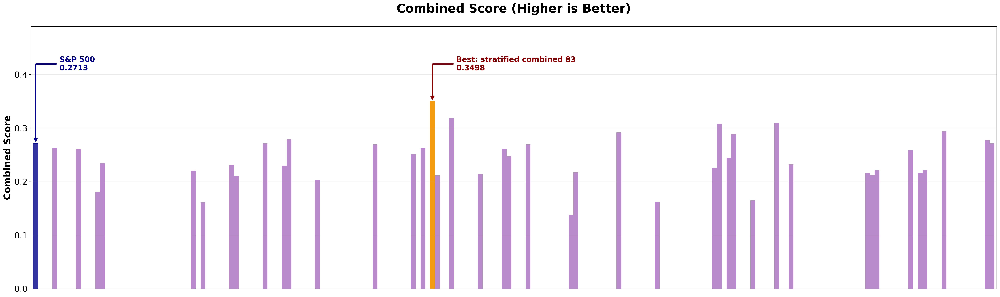

In [27]:
plt.figure(figsize=(30, 9), dpi=300)
bars = plt.bar(range(len(results_df)), results_df['combined_score'], width=1.0, color='#9b59b6', alpha=0.7)

best_idx = results_df['combined_score'].idxmax()
best_pos = results_df.index.get_loc(best_idx)
best_val = results_df.loc[best_idx, 'combined_score']
bars[best_pos].set_color('#f39c12')
bars[best_pos].set_alpha(1.0)


best_label = str(best_idx).replace('_', ' ')
max_val = results_df['combined_score'].max()

fixed_y_pos = max_val * 1.20 


plt.annotate(f'Best: {best_label}\n{best_val:.4f}', 
             xy=(best_pos, best_val), 
             xytext=(best_pos + 5, fixed_y_pos),
             ha='left', va='center', fontsize=16, fontweight='bold', color='darkred',
             arrowprops=dict(
                 arrowstyle='->', 
                 color='darkred', 
                 lw=2.5,
                 connectionstyle="angle,angleA=0,angleB=90,rad=5" # Creates the professional elbow
             ),
             bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="none", alpha=0.8))

if 'temporal_union_sp500' in results_df.index:
    sp500_pos = results_df.index.get_loc('temporal_union_sp500')
    sp500_val = results_df.loc['temporal_union_sp500', 'combined_score']
    
    bars[sp500_pos].set_color('darkblue')
    bars[sp500_pos].set_alpha(0.8)
    
    plt.annotate(f'S&P 500\n{sp500_val:.4f}', 
                 xy=(sp500_pos, sp500_val), 
                 xytext=(sp500_pos + 5, fixed_y_pos), # Matches the height of the "Best" label
                 ha='left', va='center', fontsize=16, fontweight='bold', color='darkblue',
                 arrowprops=dict(
                     arrowstyle='->', 
                     color='darkblue', 
                     lw=2.5,
                     connectionstyle="angle,angleA=0,angleB=90,rad=5"
                 ),
                 bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="none", alpha=0.8))


plt.ylim(0, max_val * 1.4) 

plt.ylabel('Combined Score', fontsize=20, fontweight='bold')
plt.title('Combined Score (Higher is Better)', fontsize=26, fontweight='bold', pad=30)
plt.tick_params(axis='y', labelsize=18)
plt.xticks([])

plt.grid(axis='y', alpha=0.3)
plt.xlim(-1, len(results_df))
plt.tight_layout()
plt.savefig('../results/figures/subset_combined_score.png', dpi=300, bbox_inches='tight')
plt.show()

For the combined score, higher is better as the combined score aggregates all three metrics into a single performance measure: `0.4 × Pearson + 0.4 × Spearman + 0.2 × (1 - MAD_normalized)`. This weighted formula emphasizes correlation strength (80%) while accounting for precision (20%), identifying subsets that best capture both the direction and magnitude of market volatility.

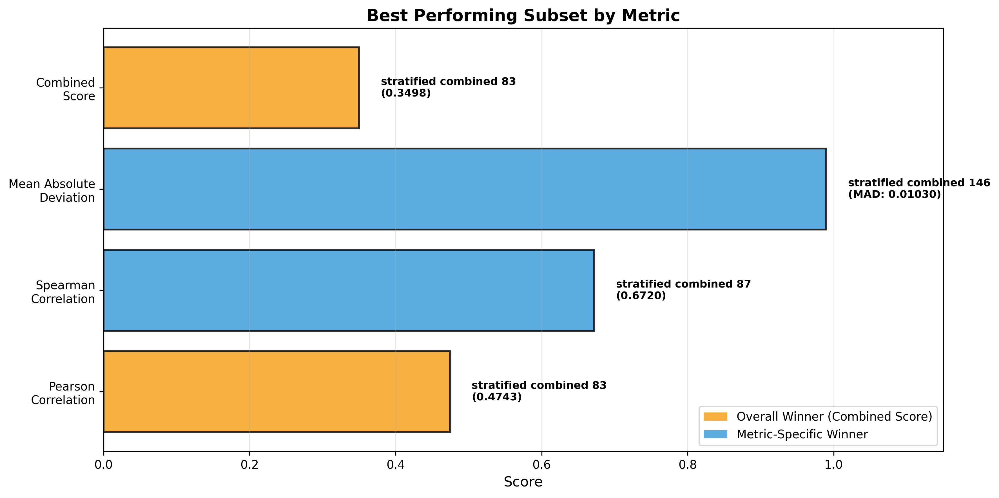

In [28]:
# Visualize best subset for each metric
fig, ax = plt.subplots(figsize=(12, 6), dpi=300)

metrics = ['Pearson\nCorrelation', 'Spearman\nCorrelation', 
           'Mean Absolute\nDeviation', 'Combined\nScore']
best_subsets = [
    results_df['pearson_correlation'].idxmax(),
    results_df['spearman_correlation'].idxmax(),
    results_df['mean_absolute_deviation'].idxmin(),
    results_df['combined_score'].idxmax()
]
scores = [
    results_df['pearson_correlation'].max(),
    results_df['spearman_correlation'].max(),
    1 - results_df['mean_absolute_deviation'].min(),
    results_df['combined_score'].max()
]

# Determine overall best subset
overall_best = results_df['combined_score'].idxmax()

# Color bars by whether it's the overall winner
colors = ['#f39c12' if subset == overall_best else '#3498db' 
          for subset in best_subsets]

bars = ax.barh(metrics, scores, color=colors, alpha=0.8, edgecolor='black', linewidth=1.5)

# Annotate with subset names and scores
for i, (bar, subset, score) in enumerate(zip(bars, best_subsets, scores)):
    # Show actual score for MAD (not inverted)
    best_label = str(subset).replace('_', ' ')
    if i == 2:
        actual_score = results_df['mean_absolute_deviation'].min()
        label = f'{best_label}\n(MAD: {actual_score:.5f})'
    else:
        label = f'{best_label}\n({score:.4f})'
    
    ax.text(score + 0.03, i, label, 
            va='center', fontsize=9, fontweight='bold')

ax.set_xlabel('Score', fontsize=12)
ax.set_title('Best Performing Subset by Metric', fontsize=14, fontweight='bold')
ax.set_xlim(0, 1.15)
ax.grid(axis='x', alpha=0.3)

# Add legend
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor='#f39c12', alpha=0.8, label='Overall Winner (Combined Score)'),
    Patch(facecolor='#3498db', alpha=0.8, label='Metric-Specific Winner')
]
ax.legend(handles=legend_elements, loc='lower right', fontsize=10)

plt.tight_layout()
plt.savefig('../results/figures/best_subset_per_metric.png', dpi=300, bbox_inches='tight')
plt.show()


## 6. Select Best Subset and Visualize Alignment


In [34]:
# Select best subset
best_name, best_tickers, best_metrics = select_best_subset(evaluation_results, all_subsets)

# Save final selected tickers
final_tickers_df = pd.DataFrame({'ticker': best_tickers})
final_tickers_df.to_csv('../data/processed/subsets/final_selected_tickers.csv', index=False)

print(f"Saved {len(best_tickers)} tickers to: data/processed/subsets/final_selected_tickers.csv")

Saved 295 tickers to: data/processed/subsets/final_selected_tickers.csv


### Final Selection Summary

**Best Subset:** stratified combined 83
**Number of Tickers:** 295

| Metric | Score |
|--------|-------|
| Pearson Correlation | 0.6478 |
| Spearman Correlation | 0.7277 |
| Mean Absolute Deviation | 0.0133 |
| **Combined Score** | **0.4534** |

This subset achieves the highest combined score, balancing strong linear correlation with good rank-order alignment and precision.


## 6.1. Top 5 Subsets Performance

### 6.1.1. Modelization Against Market

The evaluation methodology assesses how well each subset captures full-market volatility dynamics through three complementary metrics:

- Pearson Correlation (linear relationship): Measures if subset volatility moves proportionally with market volatility
- Spearman Correlation (rank-order relationship): Measures if subset and market volatility follow same directional patterns
- Mean Absolute Deviation (precision): Measures average absolute difference between subset and market volatility

**Combined Score** (weighted aggregate):
- Formula: `0.4 × Pearson + 0.4 × Spearman + 0.2 × (1 - MAD_normalized)`
- Weights: 40% linear correlation, 40% rank correlation, 20% precision
- Higher scores indicate better overall market representation



### 6.1.2. Results of Top 5 Subsets


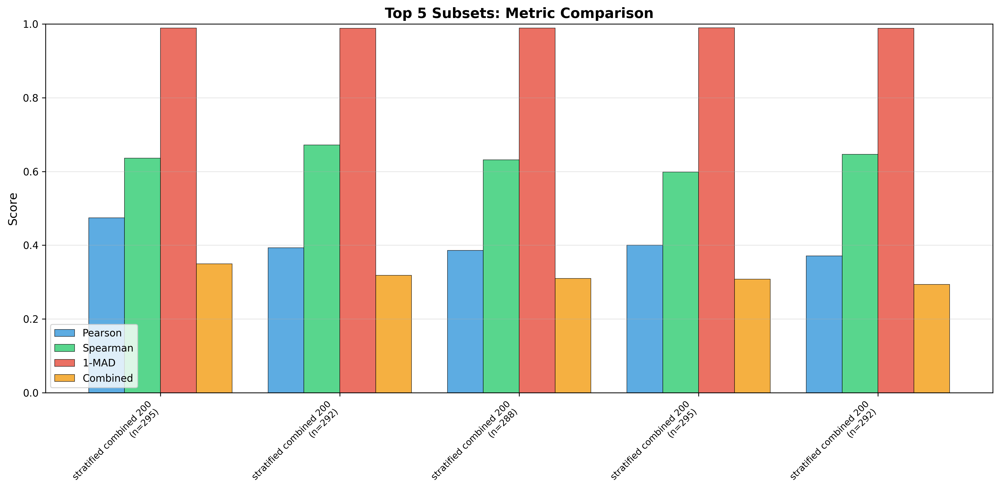

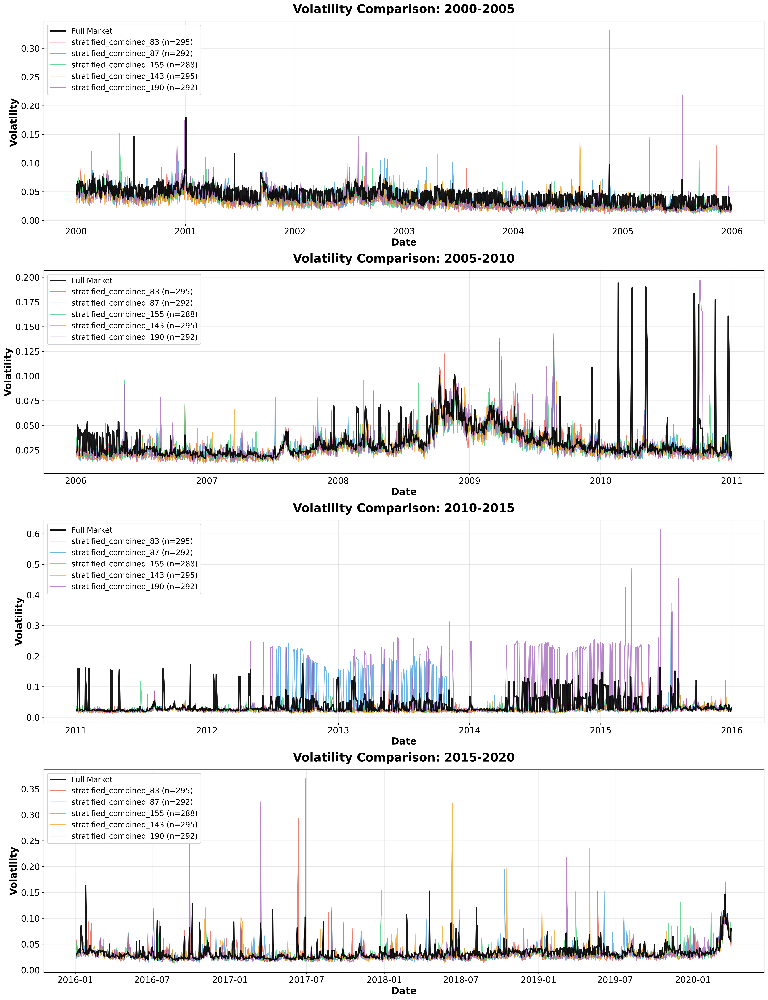

In [35]:
# Get top 5 subsets by combined score
top_5_subsets = results_df.sort_values('combined_score', ascending=False).head(5)

# Visualize top 5 subsets across all metrics
fig, ax = plt.subplots(figsize=(14, 7), dpi=300)

x = np.arange(len(top_5_subsets))
width = 0.2

metrics_to_plot = ['pearson_correlation', 'spearman_correlation', 
                   'mean_absolute_deviation', 'combined_score']
metric_labels = ['Pearson', 'Spearman', '1-MAD', 'Combined']
colors = ['#3498db', '#2ecc71', '#e74c3c', '#f39c12']

for i, (metric, label, color) in enumerate(zip(metrics_to_plot, metric_labels, colors)):
    values = top_5_subsets[metric].values
    if metric == 'mean_absolute_deviation':
        values = 1 - values
    offset = (i - 1.5) * width
    ax.bar(x + offset, values, width, label=label, color=color, alpha=0.8, edgecolor='black', linewidth=0.5)

name_clean = str(name).replace('_', ' ')

ax.set_ylabel('Score', fontsize=12)
ax.set_title('Top 5 Subsets: Metric Comparison', fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels([f'{name_clean}\n(n={int(row["n_tickers"])})' 
                     for name, row in top_5_subsets.iterrows()], 
                    rotation=45, ha='right', fontsize=9)
ax.legend(fontsize=10, loc='lower left')
ax.grid(axis='y', alpha=0.3)
ax.set_ylim(0, 1.0)
plt.tight_layout()
plt.savefig('../results/figures/top5_metrics_comparison.png', dpi=300, bbox_inches='tight')
plt.show()



top_5_volatilities = {}
for subset_name in top_5_subsets.index:
    subset_tickers = all_subsets[subset_name]
    subset_df = features_df[features_df['ticker'].isin(subset_tickers)]
    subset_vol = compute_market_volatility_index_unified(subset_df)
    subset_vol['Date'] = pd.to_datetime(subset_vol['Date'])
    subset_vol.set_index('Date', inplace=True)
    top_5_volatilities[subset_name] = subset_vol

# Time periods
periods = [
    ('2000-2005', '2000-01-01', '2005-12-31'),
    ('2005-2010', '2006-01-01', '2010-12-31'),
    ('2010-2015', '2011-01-01', '2015-12-31'),
    ('2015-2020', '2016-01-01', '2020-04-01')
]

colors = ['#e74c3c', '#3498db', '#2ecc71', '#f39c12', '#9b59b6']

fig, axes = plt.subplots(4, 1, figsize=(20, 26), dpi=300) # Increased size

for idx, (period_name, start_date, end_date) in enumerate(periods):
    ax = axes[idx]
    
    period_start = pd.to_datetime(start_date)
    period_end = pd.to_datetime(end_date)
    market_period = market_volatility_df.loc[period_start:period_end]
    
    # Plot Full Market
    ax.plot(market_period.index, market_period['market_volatility'], 
            label='Full Market', color='black', alpha=0.9, linewidth=2.5, zorder=10)
    
    # Plot Top 5
    for subset_idx, (subset_name, color) in enumerate(zip(top_5_subsets.index, colors)):
        subset_vol = top_5_volatilities[subset_name]
        subset_period = subset_vol.loc[period_start:period_end]

        subset_clean = str(subset_name).replace('_', ' ')
        
        score = top_5_subsets.loc[subset_name, 'combined_score']
        n_tickers = int(top_5_subsets.loc[subset_name, 'n_tickers'])
        
        ax.plot(subset_period.index, subset_period['market_volatility'], 
                label=f'{subset_name} (n={n_tickers})', 
                color=color, alpha=0.7, linewidth=1.5)


    # Big Text Settings
    ax.set_xlabel('Date', fontsize=18, fontweight='bold')
    ax.set_ylabel('Volatility', fontsize=18, fontweight='bold')
    ax.set_title(f'Volatility Comparison: {period_name}', fontsize=22, fontweight='bold', pad=15)
    ax.tick_params(axis='both', which='major', labelsize=16) 
    ax.legend(loc='upper left', fontsize=14, framealpha=0.9)
    ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig('../results/figures/top5_subsets_vs_market_by_period.png', dpi=300, bbox_inches='tight')
plt.show()

## 6.2. Why Stratified Random Subsets Outperform S&P 500

### 6.2.1. Saving Stock Composition


Stock composition saved to: data/processed/subsets/best_subset_composition.csv (295 tickers)


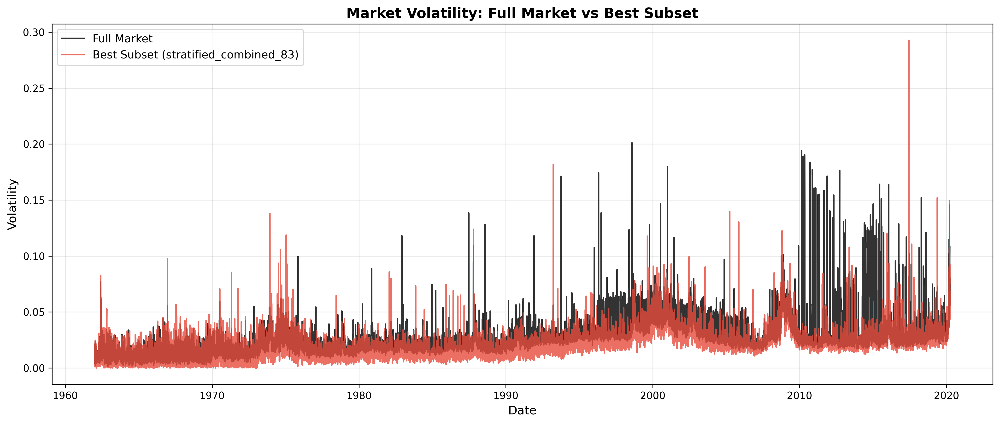

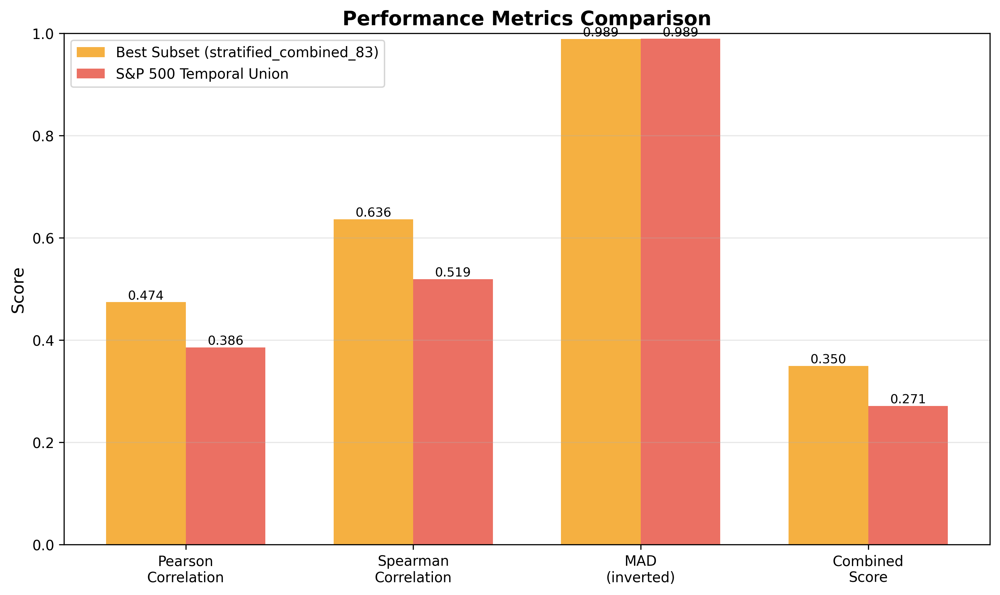

In [36]:
# Save stock composition to CSV (sorted alphabetically)
sorted_tickers = sorted(best_tickers)
composition_df = pd.DataFrame({'ticker': sorted_tickers})
composition_df.to_csv('../data/processed/subsets/best_subset_composition.csv', index=False)
print(f"Stock composition saved to: data/processed/subsets/best_subset_composition.csv ({len(sorted_tickers)} tickers)")

# Visualize volatility alignment for best subset
from src.data.indicators.volatility import compute_market_volatility_index_unified

# Compute best subset volatility
best_subset_df = features_df[features_df['ticker'].isin(best_tickers)]
best_subset_volatility = compute_market_volatility_index_unified(best_subset_df)
best_subset_volatility['Date'] = pd.to_datetime(best_subset_volatility['Date'])
best_subset_volatility.set_index('Date', inplace=True)

# Plot 1: Volatility alignment over time
plt.figure(figsize=(14, 6))
plt.plot(market_volatility_df.index, market_volatility_df['market_volatility'], 
         label='Full Market', alpha=0.8, linewidth=1.5, color='black')
plt.plot(best_subset_volatility.index, best_subset_volatility['market_volatility'], 
         label=f'Best Subset ({best_name})', alpha=0.8, linewidth=1.5, color='#e74c3c')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Volatility', fontsize=12)
plt.title(f'Market Volatility: Full Market vs Best Subset', fontsize=14, fontweight='bold')
plt.legend(fontsize=11)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('../results/figures/best_subset_volatility_alignment.png', dpi=300)
plt.show()

# Plot 2: Performance metrics comparison
fig, ax = plt.subplots(figsize=(10, 6), dpi=300)

metrics_names = ['Pearson\nCorrelation', 'Spearman\nCorrelation', 'MAD\n(inverted)', 'Combined\nScore']
best_values = [
    best_metrics['pearson_correlation'],
    best_metrics['spearman_correlation'],
    1 - best_metrics['mean_absolute_deviation'],  # Invert MAD so higher is better
    best_metrics['combined_score']
]

# Get S&P 500 metrics if available
if 'temporal_union_sp500' in results_df.index:
    sp500_metrics = results_df.loc['temporal_union_sp500']
    sp500_values = [
        sp500_metrics['pearson_correlation'],
        sp500_metrics['spearman_correlation'],
        1 - sp500_metrics['mean_absolute_deviation'],  # Invert MAD
        sp500_metrics['combined_score']
    ]
    
    x = np.arange(len(metrics_names))
    width = 0.35
    
    bars1 = ax.bar(x - width/2, best_values, width, label=f'Best Subset ({best_name})', 
                   color='#f39c12', alpha=0.8)
    bars2 = ax.bar(x + width/2, sp500_values, width, label='S&P 500 Temporal Union', 
                   color='#e74c3c', alpha=0.8)
    
    # Add value labels on bars
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height,
                   f'{height:.3f}',
                   ha='center', va='bottom', fontsize=9)
else:
    # Only best subset
    bars = ax.bar(metrics_names, best_values, color='#f39c12', alpha=0.8)
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
               f'{height:.3f}',
               ha='center', va='bottom', fontsize=9)

ax.set_ylabel('Score', fontsize=12)
ax.set_title('Performance Metrics Comparison', fontsize=14, fontweight='bold')
ax.set_xticks(x if 'temporal_union_sp500' in results_df.index else range(len(metrics_names)))
ax.set_xticklabels(metrics_names, fontsize=10)
ax.legend(fontsize=10)
ax.grid(axis='y', alpha=0.3)
ax.set_ylim(0, 1.0)

plt.tight_layout()
plt.savefig('../results/figures/best_subset_metrics_comparison.png', dpi=300)
plt.show()


### 6.2.2. Performance Comparison: Stratified Subset vs S&P 500

**Why the stratified subset outperforms S&P 500:**

The plots above demonstrate that the stratified subset achieves superior correlation with full-market volatility compared to the S&P 500 temporal union. This performance gap stems from fundamental differences in composition:


**S&P 500 Limitations:**
- Large-cap bias: Index is market-cap weighted, dominated by mega-cap stocks
- Sector concentration: Tech giants represent disproportionate weight
- Survivorship bias: Even temporal union misses failed companies between snapshots
- Limited volatility range: Large-caps tend to be less volatile than small-caps

**Stratified Subset Advantages:**
- Equal representation across volatility regimes captures full spectrum of market stress
- Inclusion of small and mid-cap stocks better reflects retail investor behavior
- Volume stratification ensures both liquid and illiquid stocks are represented
- Balanced sampling prevents any single market segment from dominating the signal

**Key Insight:**
Market volatility is not just driven by large-cap movements. During stress periods, small-cap stocks often lead volatility spikes, and retail-heavy stocks exhibit different panic patterns. The stratified approach captures these dynamics that S&P 500 misses, resulting in higher correlation with true market-wide volatility.


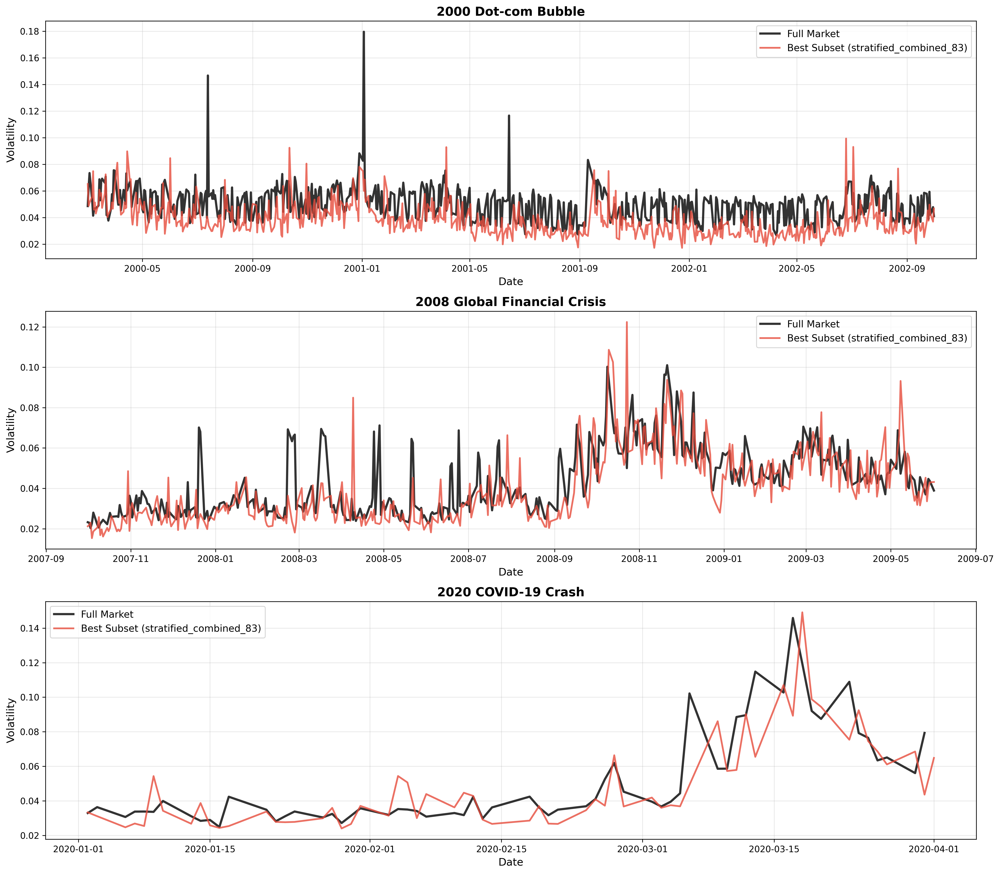

In [37]:
# Focus on 3 major crises: Dot-com, Global Financial Crisis, COVID-19
# Plot them vertically for clear visualization
crisis_periods = {
    '2000 Dot-com Bubble': ('2000-03-01', '2002-10-01'),
    '2008 Global Financial Crisis': ('2007-10-01', '2009-06-01'),
    '2020 COVID-19 Crash': ('2020-01-01', '2020-04-01')  # Dataset ends 2020-04-01
}

# Create vertical layout (3 rows, 1 column)
fig, axes = plt.subplots(3, 1, figsize=(16, 14))

for idx, (crisis_name, (start, end)) in enumerate(crisis_periods.items()):
    crisis_start = pd.to_datetime(start)
    crisis_end = pd.to_datetime(end)
    
    # Filter data to crisis period
    market_crisis = market_volatility_df.loc[crisis_start:crisis_end]
    subset_crisis = best_subset_volatility.loc[crisis_start:crisis_end]
    
    # Plot if we have data
    if len(market_crisis) > 0 and len(subset_crisis) > 0:
        axes[idx].plot(market_crisis.index, market_crisis['market_volatility'], 
                      label='Full Market', color='black', alpha=0.8, linewidth=2.5)
        axes[idx].plot(subset_crisis.index, subset_crisis['market_volatility'], 
                      label=f'Best Subset ({best_name})', color='#e74c3c', alpha=0.8, linewidth=2)
        axes[idx].set_xlabel('Date', fontsize=12)
        axes[idx].set_ylabel('Volatility', fontsize=12)
        axes[idx].set_title(crisis_name, fontsize=14, fontweight='bold')
        axes[idx].legend(fontsize=11)
        axes[idx].grid(alpha=0.3)
    else:
        axes[idx].text(0.5, 0.5, f'No data for {crisis_name}', 
                       ha='center', va='center', transform=axes[idx].transAxes, fontsize=12)
        axes[idx].set_title(crisis_name, fontsize=14, fontweight='bold')

plt.tight_layout()
plt.savefig('../results/figures/crisis_periods_best_subset.png', dpi=300)
plt.show()


## 7. Create Features for Best Subset

Use the best-performing subset as input for subsequent analysis steps.

In [38]:
%load_ext autoreload
%autoreload 2

In [39]:
# Import indicator functions
from src.data.indicators.returns import compute_daily_returns_unified
from src.data.indicators.volatility import compute_market_volatility_index_unified
from src.data.indicators.mood_indicators import (
    compute_market_direction_unified,
    compute_market_volume_unified,
    compute_market_correlation_dynamic,
    compute_market_breadth_unified,
    compute_market_atr_unified,
    compute_mood_index,
    compute_subset_pc_scores
)

In [40]:
# Load cleaned data
cleaned_df = pd.read_csv('../data/processed/nasdaq_processed.csv')
cleaned_df['Date'] = pd.to_datetime(cleaned_df['Date'])

# Filter to final selected tickers (best subset from evaluation)
best_subset_df = cleaned_df[cleaned_df['ticker'].isin(final_tickers_df['ticker'])]


--- Analysis of data availability ---
Target date for warm-up (252 days buffer) : 1999-01-01
Ticker number available before this date : 63

--- Recommendation ---
Set 'sample_size' to roughly 63


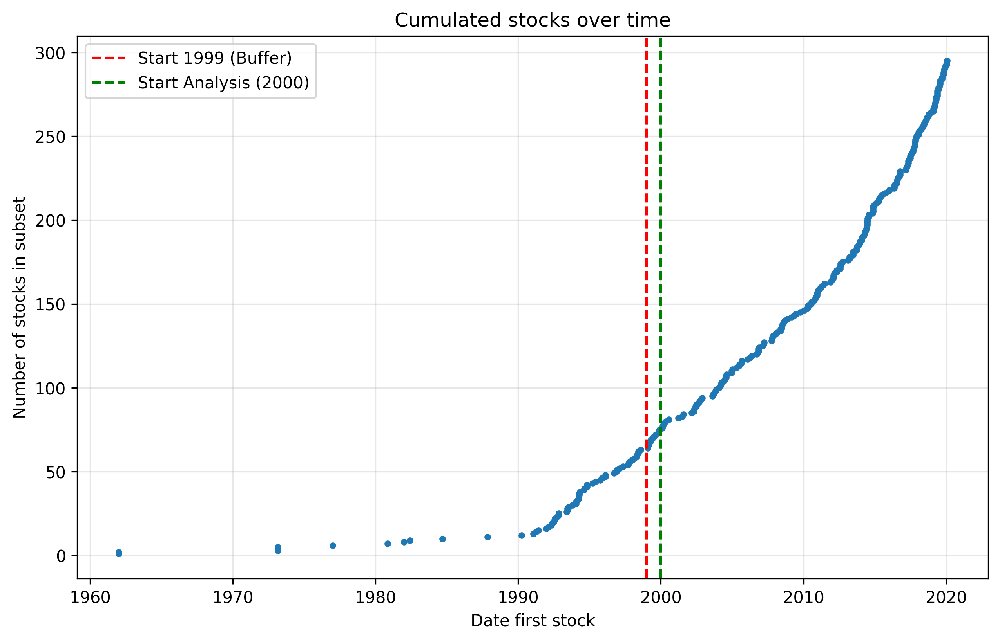

In [41]:
# 1. S'assurer que la colonne Date est bien au format datetime
best_subset_df['Date'] = pd.to_datetime(best_subset_df['Date'])

# 2. Trouver la date de première cotation pour chaque ticker
start_dates = best_subset_df.groupby('ticker')['Date'].min().sort_values()

# 3. Définir la date limite (1er Janvier 1999 pour avoir 1 an de buffer avant 2000)
cutoff_date = pd.Timestamp('1999-01-01')

# 4. Compter les stocks
stocks_available_1999 = start_dates[start_dates <= cutoff_date]
total_stocks = len(start_dates)
count_1999 = len(stocks_available_1999)

print(f"--- Analysis of data availability ---")
print(f"Target date for warm-up (252 days buffer) : {cutoff_date.date()}")
print(f"Ticker number available before this date : {count_1999}")

# 5. Recommendation pour le sample_size
recommended_sample = min(count_1999, 100) # On ne peut pas sampler plus que ce qu'on a
print(f"\n--- Recommendation ---")
if count_1999 < 10:
    print(f"Very small number of stocks, might be problematic ({count_1999}) en 1999.")
    print("correlation will be really noisy")
else:
    print(f"Set 'sample_size' to roughly {recommended_sample}")

# 6. Visualisation : "Ramp-up" des stocks disponibles
# Cela te montrera graphiquement quand tes stocks arrivent sur le marché
plt.figure(figsize=(10, 6))
plt.plot(start_dates.values, range(1, total_stocks + 1), marker='.', linestyle='none')
plt.axvline(cutoff_date, color='r', linestyle='--', label='Start 1999 (Buffer)')
plt.axvline(pd.Timestamp('2000-01-01'), color='g', linestyle='--', label='Start Analysis (2000)')

plt.title("Cumulated stocks over time")
plt.xlabel("Date first stock")
plt.ylabel("Number of stocks in subset")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

In [42]:
model_path = '../data/processed/pca_mood_model.joblib'
loaded_package = joblib.load(model_path)

# 2. Extract the PCA object and the feature list
global_pca = loaded_package['pca_model']
global_features = loaded_package['feature_cols']

print("Model loaded successfully.")
print(f"Input features expected: {global_features}")

Model loaded successfully.
Input features expected: ['market_volatility', 'market_atr', 'market_correlation', 'market_volume', 'market_breadth', 'market_direction']


In [43]:
# 3. Now you can run your helper function using the loaded model

moodindex = compute_subset_pc_scores(best_subset_df, global_pca, global_features, recommended_sample)

Computing indicators for subset...


Calculating rolling correlation: 100%|██████████████████████████████████████████| 14633/14633 [00:41<00:00, 350.83it/s]


Standardizing subset features...


In [45]:
# Save features DataFrame for best subset
output_path_features = Path('../data/processed/best_subset_features.csv')
moodindex.to_csv(output_path_features, index=True)
print(f"Features data saved to: {output_path_features}")
print(f"Shape: {moodindex.shape}")
print(f"Subset: {best_name} ({len(best_tickers)} tickers)")

Features data saved to: ..\data\processed\best_subset_features.csv
Shape: (14663, 8)
Subset: stratified_combined_83 (295 tickers)
